<a href="https://colab.research.google.com/github/laventura/mir_stuff/blob/main/MIR_Day2_Spectral_features.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import signal
from IPython.display import Audio


# Set up plotting style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

We generated a signal with two frequencies

In [ ]:
# --- Signal Parameters ---
freq1 = 200  # Hz
duration1 = 0.05 #second
freq2 = 600  # Hz

sampling_rate = 44100

# -- calc durations
num_samples1 = int(duration1 * sampling_rate)
# we want total samples to be some power of 2
L_total = 2**int(np.ceil(np.log2(num_samples1)))
num_samples2 = L_total - num_samples1
duration2 = num_samples2 / sampling_rate

# L_total = num_samples1 + num_samples2
print(f"Total samples: {L_total=}, {num_samples1=}, {num_samples2=}")

Total samples: L_total=4096, num_samples1=2205, num_samples2=1891


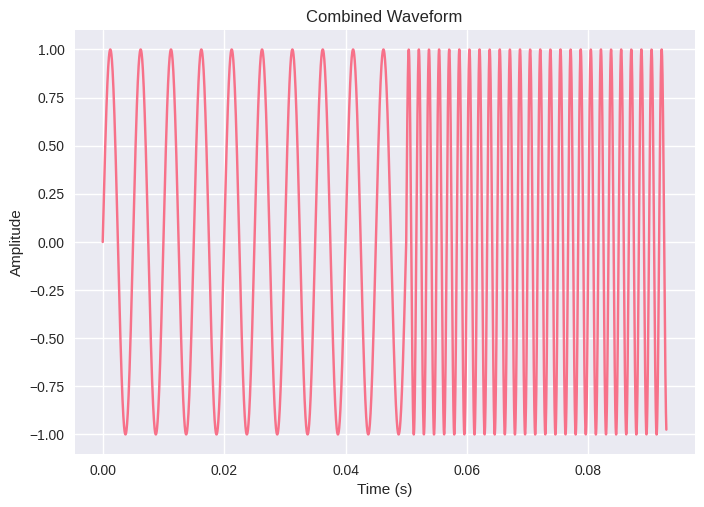

In [ ]:
# - create time vectors -
t1 = np.linspace(0, duration1, num_samples1, endpoint=False)
t2 = np.linspace(0, duration2, num_samples2, endpoint=False)

# - generate waveforms -
data1 = np.sin(2 * np.pi * freq1 * t1)
data2 = np.sin(2 * np.pi * freq2 * t2)

# - combine waveforms -
data_combined = np.concatenate((data1, data2))
# create global time vector for plotting
t_combined  = np.linspace(0, duration1 + duration2, L_total, endpoint=False)
plt.plot(t_combined, data_combined)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Combined Waveform')
plt.grid(True)

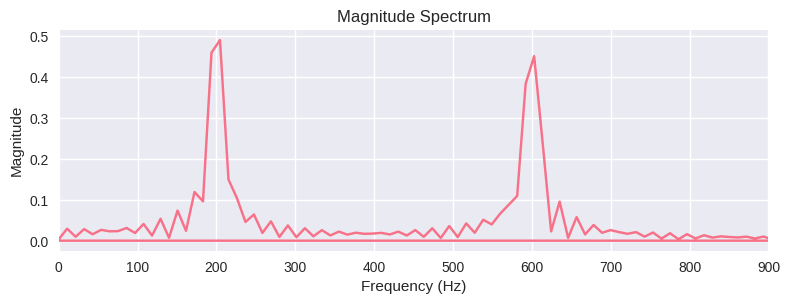


--- FFT analysis ---
Peak near freq1=200, Frequency=204.57, Magnitude=0.49
Peak near freq2=600, Frequency=602.93, Magnitude=0.45


In [ ]:
## Perform FFT on the signal and plot the frequency domain

# 1 - perform FFT
fft_output = np.fft.fft(data_combined)

# 2 - calc. corresponding frequencies
frequencies = np.fft.fftfreq(L_total, d=1/sampling_rate)

# 3 - take magnitude
magnitude_spectrum = np.abs(fft_output)

# We only care about positive frequencies and typically scale by 2
# (except for DC component at freq=0, which is typically not scaled by 2)
# np.fft.fftfreq already arranges frequencies.
# Find the index where frequencies become positive (or just take the first half)
# N/2 + 1 for incl
# 4 - consider the one-sided spectrum for real signals
num_unique_points = int(L_total/2) + 1
positive_frequencies = frequencies[:num_unique_points]
positive_magnitude_spectrum = magnitude_spectrum[:num_unique_points]

# The np.fft.fft function, by default, implements the DFT definition without any 1/N normalization.
# This is a common convention in many FFT libraries.
# It's left to the user to apply the appropriate scaling factors based on
# what they want the FFT output to represent
# Scale the amplitude to reflect actual component amplitudes
# For a sine wave of amplitude A, a single peak in the FFT has magnitude N*A/2.
# So, the actual amplitude A = (magnitude_spectrum * 2) / N
# The DC component (0 Hz) is not scaled by 2.

positive_magnitude_spectrum[1:] = positive_magnitude_spectrum[1:] * 2
positive_magnitude_spectrum = positive_magnitude_spectrum / L_total

# 5 - Plot the magnitude spectrum
plt.subplot(2, 1, 2)
plt.plot(positive_frequencies, positive_magnitude_spectrum)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.title('Magnitude Spectrum')
plt.grid(True)
plt.xlim(0,  max(freq1, freq2) * 1.5)
plt.tight_layout()
plt.show()

# print frequencies and mag where peaks are expected
# find indices of peaks around your frequencies
tolerance = 5 # Hz, for peak finding
peak1_idx = np.argmin(np.abs(positive_frequencies - freq1))
peak2_idx = np.argmin(np.abs(positive_frequencies - freq2))

print("\n--- FFT analysis ---")
print(f"Peak near {freq1=}, Frequency={positive_frequencies[peak1_idx]:.2f}, Magnitude={positive_magnitude_spectrum[peak1_idx]:.2f}")
print(f"Peak near {freq2=}, Frequency={positive_frequencies[peak2_idx]:.2f}, Magnitude={positive_magnitude_spectrum[peak2_idx]:.2f}")

The Fourier transform yields frequency information that is averaged over the entire time domain. However, the information on when these frequencies occur is hidden in the transform. The Short-time Fourier Transform (STFT) is introduced to recover the hidden time information by considering only a small section of the signal. To begin with this, we need a window function.

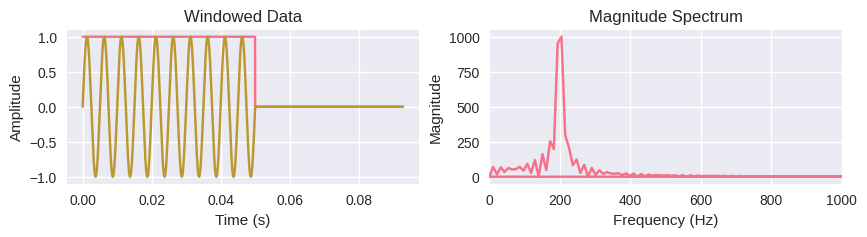

In [ ]:
# define a windowed FT
def get_windowed_ft(time, signal, sampling_rate, my_window):

  windowed_data = signal * my_window # yields a windowed data
  plt.figure(figsize=(10, 2))
  plt.subplot(1, 2, 1)
  plt.plot(time, my_window)
  plt.plot(time, windowed_data)
  plt.xlabel('Time (s)')
  plt.ylabel('Amplitude')
  plt.title('Windowed Data')
  plt.grid(True)

  # lets do FFT again
  fft_out = np.fft.fft(windowed_data)
  frequencies = np.fft.fftfreq(N, d=1/sampling_rate)
  magnitude_spectrum = np.abs(fft_out)
  freq_positive = frequencies[:L_total//2 + 1]
  magnitude_spectrum_positive = magnitude_spectrum[:L_total//2 + 1]
  plt.subplot(1, 2, 2)
  plt.plot(freq_positive, magnitude_spectrum_positive)
  plt.xlabel('Frequency (Hz)')
  plt.ylabel('Magnitude')
  plt.title('Magnitude Spectrum')
  plt.xlim(0, 1000)
  plt.grid(True)

# lets do windoed FFT
N = len(data_combined)
my_window1 = np.zeros(N)
my_window1[:num_samples1] = 1
get_windowed_ft(t_combined, data_combined, sampling_rate, my_window1)

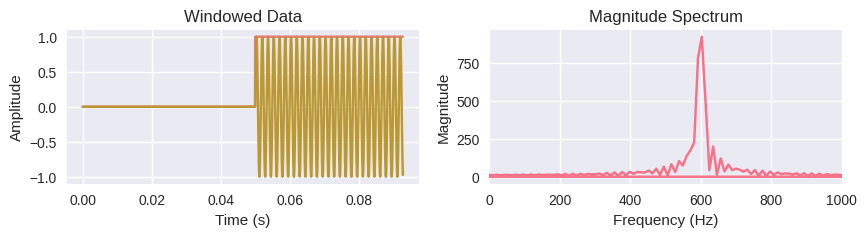

In [ ]:
# another window
my_window2 = np.zeros(N)
my_window2[num_samples1:] = 1
get_windowed_ft(t_combined, data_combined, sampling_rate, my_window2)

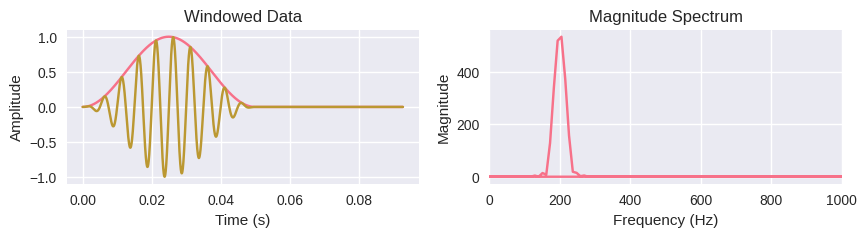

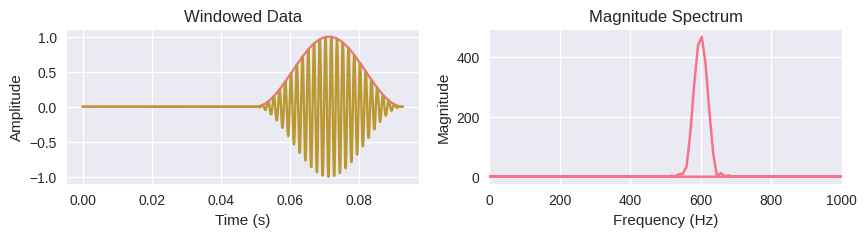

In [ ]:
# let's do a hanninhg window - we get beter frequency separation
my_hanning_window1 = np.zeros(N)
my_hanning_window1[:num_samples1] = signal.windows.hann(num_samples1)
get_windowed_ft(t_combined, data_combined, sampling_rate, my_hanning_window1)

my_hanning_window2 = np.zeros(N)
my_hanning_window2[num_samples1:] = signal.windows.hann(num_samples2)
get_windowed_ft(t_combined, data_combined, sampling_rate, my_hanning_window2)

We see that we get better frequency separation!

### STFT

Short-Time Fourier Transform (STFT) divides a longer signal into smaller, overlapping segments and then applies the Fourier transform to each segment, providing a time-localized frequency representation (The spectrogram). The spectrogram can be defined as an intensity plot (usually on a log scale, such as dB) of the Short-Time Fourier Transform (STFT) magnitude. The STFT is simply a sequence of FFTs of windowed data segments , where the windows are usually allowed to overlap in time, typically by 25-50% For details of STFT, you may refer to https://ccrma.stanford.edu/~jos/sasp/Mathematical_Definition_STFT.html

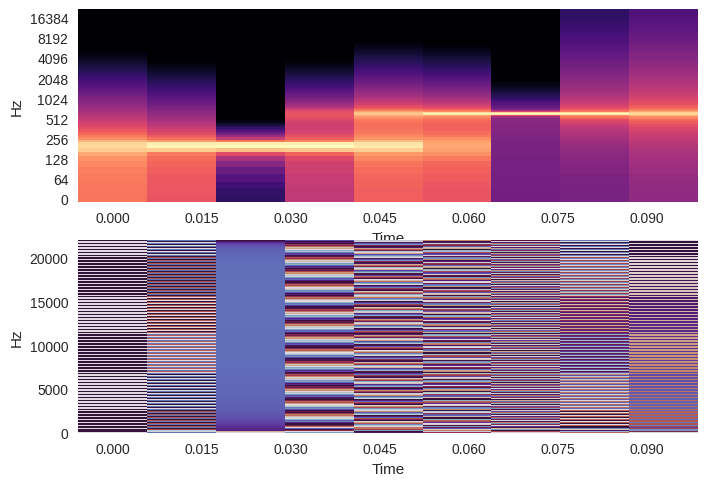

In [ ]:
# compute the STFT
stft = librosa.stft(data_combined)
# magnitude
stft_db = librosa.amplitude_to_db(np.abs(stft), ref=np.max)
plt.subplot(2,1,1)
librosa.display.specshow(stft_db, sr=sampling_rate, x_axis='time', y_axis='log')

plt.subplot(2,1,2)
phase = np.angle(stft)  # phase info
librosa.display.specshow(phase, sr=sampling_rate, x_axis='time', y_axis='hz', cmap='twilight')


Let's analyze on a real music signal

In [ ]:
def load_and_analyze_audio(file_path=None, use_example=True):
  """
  Load audio file and display basic info
  """
  if use_example:
    # use a more rhythmic example from librosa
    y, sr = librosa.load(librosa.ex('choice'))
    file_name = "Choice (example)"
  else:
    y, sr = librosa.load(file_path)
    file_name = file_path

  # basic audio info
  duration = librosa.get_duration(y=y, sr=sr)
  num_samples = len(y)
  print(f"Audio file: {file_name}")
  print(f"Sample rate: {sr=}")
  print(f"Duration: {duration=:.2f}")
  print(f"Number of samples: {num_samples=}")
  print(f"Audio shape: {y.shape=}")
  print(f"Data type: {y.dtype=}")
  print(f"Value range: {np.min(y):.3f} to {np.max(y):.3f}")

  display(Audio(y, rate=sr))

  return y, sr, duration


In [ ]:
# load some samples:
y, sr, duration = load_and_analyze_audio()

Audio file: Choice (example)
Sample rate: sr=22050
Duration: duration=25.03
Number of samples: num_samples=551823
Audio shape: y.shape=(551823,)
Data type: y.dtype=dtype('float32')
Value range: -0.329 to 0.381


In [ ]:
# load some samples:
y, sr, duration = load_and_analyze_audio()

Audio file: Choice (example)
Sample rate: sr=22050
Duration: duration=25.03
Number of samples: num_samples=551823
Audio shape: y.shape=(551823,)
Data type: y.dtype=dtype('float32')
Value range: -0.329 to 0.381


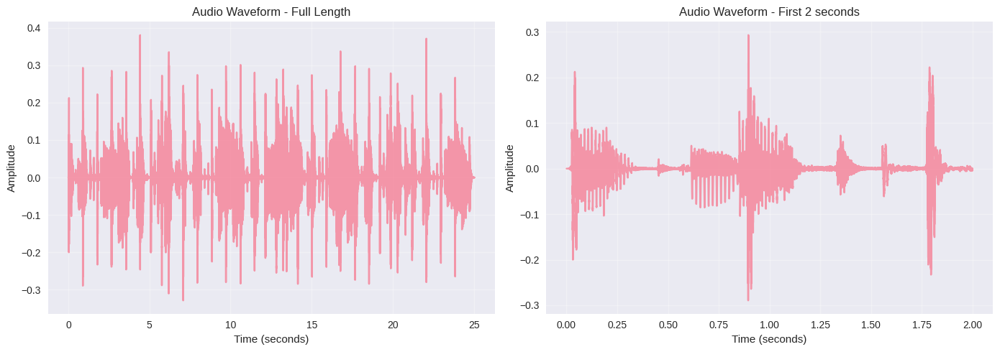

In [ ]:
def plot_waveform(y, sr, title="Audio Waveform"):
    """
    Plot the time-domain waveform
    """
    plt.figure(figsize=(14, 5))

    # Time axis
    time = np.linspace(0, len(y) / sr, len(y))

    plt.subplot(1, 2, 1)
    plt.plot(time, y, alpha=0.7)
    plt.title(f'{title} - Full Length')
    plt.xlabel('Time (seconds)')
    plt.ylabel('Amplitude')
    plt.grid(True, alpha=0.3)

    # Zoom in on first 2 seconds
    plt.subplot(1, 2, 2)
    samples_2s = int(2 * sr)
    plt.plot(time[:samples_2s], y[:samples_2s], alpha=0.7)
    plt.title(f'{title} - First 2 seconds')
    plt.xlabel('Time (seconds)')
    plt.ylabel('Amplitude')
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

plot_waveform(y, sr)

In [ ]:
## Compute and plot STFT
def compute_and_plot_stft(y, sr, title='STFT analysis'):

  stft = librosa.stft(y)
  stft_db = librosa.amplitude_to_db(np.abs(stft), ref=np.max)

  plt.figure(figsize=(15, 10))
  plt.subplot(2, 2, 1)

  # magnitude spectruc
  librosa.display.specshow(stft_db, sr=sr, x_axis='time', y_axis='hz')
  plt.colorbar(format='%+2.0f dB')
  plt.title(f'{title} - Magnitude')
  plt.xlabel('Time (seconds)')
  plt.ylabel('Frequency (Hz)')
  # plot log freq scale
  plt.subplot(2, 2, 2)
  librosa.display.specshow(stft_db, sr=sr, x_axis='time', y_axis='log')
  plt.colorbar(format='%+2.0f dB')
  plt.title(f'{title} - Magnitude (log scale)')
  plt.xlabel('Time (seconds)')
  plt.ylabel('Frequency (Hz)')

  # plot phase spectrogram
  plt.subplot(2, 2, 3)
  phase = np.angle(stft)  # phase info
  librosa.display.specshow(phase, sr=sr, x_axis='time', y_axis='hz', cmap='twilight')
  plt.title(f'{title} - Phase')
  plt.xlabel('Time (seconds)')
  plt.ylabel('Frequency (Hz)')

  # plot spectral centroid over time
  plt.subplot(2, 2, 4)
  spectral_centroids = librosa.feature.spectral_centroid(y=y, sr=sr)[0]
  frames = range(len(spectral_centroids))
  t = librosa.frames_to_time(frames, sr=sr)
  plt.plot(t, librosa.util.normalize(spectral_centroids), alpha=0.8, linewidth=2)
  plt.title(f'{title} - Spectral Centroid over time')
  plt.xlabel('Time (seconds)')
  plt.grid(True, alpha=0.3)
  plt.tight_layout()
  plt.show()

  return stft, stft_db


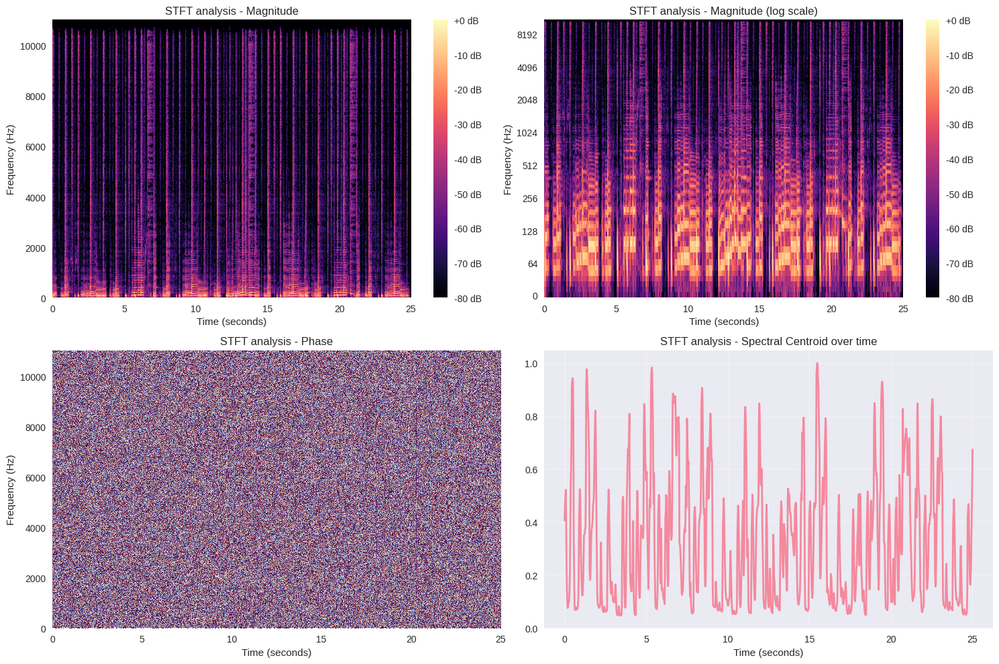

In [ ]:
# lets do stft
stft_classical, stft_db_classical = compute_and_plot_stft(y, sr)

In [ ]:
### Analyze spectral features

def analyze_spectral_features(y, sr, title='Spectral Features'):

  # compute spectral features
  spectral_centroids = librosa.feature.spectral_centroid(y=y, sr=sr)[0]
  spectral_bandwidth = librosa.feature.spectral_bandwidth(y=y, sr=sr)[0]
  spectral_rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)[0]
  zcr = librosa.feature.zero_crossing_rate(y)[0]

  # timeframes
  frames = range(len(spectral_centroids))
  t = librosa.frames_to_time(frames, sr=sr)

  # plot
  plt.figure(figsize=(15, 12))
  plt.subplot(3, 2, 1)
  plt.plot(t, spectral_centroids, alpha=0.8, linewidth=2)
  plt.title(f'{title} - Spectral Centroid over time')
  plt.xlabel('Time (seconds)')
  plt.ylabel('Frequency (Hz)')
  plt.legend()
  plt.grid(True, alpha=0.3)

  plt.subplot(3, 2, 2)
  plt.plot(t, spectral_bandwidth, alpha=0.8, linewidth=2)
  plt.title(f'{title} - Spectral Bandwidth over time')
  plt.xlabel('Time (seconds)')
  plt.ylabel('Frequency (Hz)')
  plt.legend()
  plt.grid(True, alpha=0.3)

  plt.subplot(3, 2, 3)
  plt.plot(t, spectral_rolloff, alpha=0.8, linewidth=2)
  plt.title(f'{title} - Spectral Rolloff over time')
  plt.xlabel('Time (seconds)')
  plt.ylabel('Frequency (Hz)')
  plt.legend()
  plt.grid(True, alpha=0.3)

  # ZCR
  plt.subplot(3, 2, 4)
  zcr_t = librosa.frames_to_time(range(len(zcr)), sr=sr)
  plt.plot(zcr_t, zcr, alpha=0.8, linewidth=2)
  plt.title(f'{title} - Zero Crossing Rate over time')
  plt.xlabel('Time (seconds)')
  plt.ylabel('ZCRate')
  plt.legend()
  plt.grid(True, alpha=0.3)

  # combined view
  plt.subplot(3, 1, 3)
  plt.plot(t, spectral_centroids, alpha=0.8, linewidth=2, label='Spectral Centroid')
  plt.plot(t, spectral_bandwidth, alpha=0.8, linewidth=2, label='Spectral Bandwidth')
  plt.plot(t, spectral_rolloff, alpha=0.8, linewidth=2, label='Spectral Rolloff')
  plt.xlabel('Time (seconds)')
  plt.ylabel('Frequency (Hz)')
  plt.legend()
  plt.grid(True, alpha=0.3)

  plt.tight_layout()
  plt.show()

  return {
      "spectral_centroids": spectral_centroids,
      "spectral_bandwidth": spectral_bandwidth,
      "spectral_rolloff": spectral_rolloff,
      "zcr": zcr
  }


/tmp/ipython-input-1085506613.py:22: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipython-input-1085506613.py:30: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipython-input-1085506613.py:38: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipython-input-1085506613.py:48: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


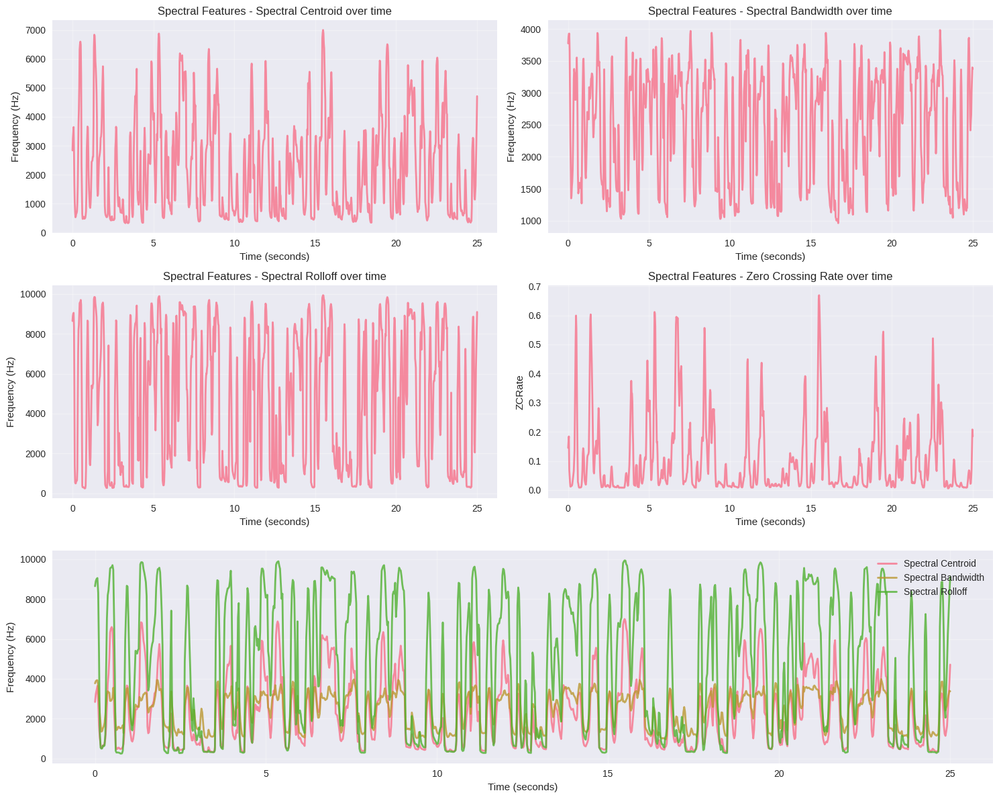

In [ ]:
features_music = analyze_spectral_features(y, sr)

In [ ]:
# connect with google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls -l /content/drive/MyDrive/

ls: '/content/drive/MyDrive/Ray Tracing': No such file or directory
ls: /content/drive/MyDrive/PyTorchZeroToAll: No such file or directory
total 896186
-rw------- 1 root root    228196 Jun 25  2013 '06-24-2013 - EOTM - To Have and To Have Not.pdf'
-rw------- 1 root root   3792649 Apr  6  2021  2020-01-1204_SAE_Waterloo_paper_AAA_NCNU.pdf
-rw------- 1 root root   3805641 Apr  6  2021  2020-01-1207_SAE_WCX_2020_Collision_Avoidance_Metric.pdf
-r-------- 1 root root       177 Jul 28 18:42 '2022 DataCamp Course Wishlist.gsheet'
-rw------- 1 root root     90509 Jun 10  2023  2023-06-09_AtulElectric...5724.csv
-rw------- 1 root root       177 Jan 19  2022  220119_AD_Global_Network_uploaded.gdoc
-r-------- 1 root root    307510 Aug  2  2018 '3A-4 Choi.pdf'
-rw------- 1 root root    484679 Nov 15  2018 '54 Mr. Atul Acharya.pdf'
-rw------- 1 root root   5057321 Apr  6  2021 'AAA AV Testing Intro - Aug 2020.pdf'
-rw------- 1 root root       177 Oct 15  2018 'AAA case study.gslides'
-rw------- 1 r

In [ ]:
# Download video from Youtube
#

In [ ]:
!pip install yt-dlp
!apt-get update
!apt-get install ffmpeg -y

Hit:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:3 https://cli.github.com/packages stable InRelease
Hit:4 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:5 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:6 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:7 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:9 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Hit:11 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading packag

# Task
Write a Python function that takes a YouTube video URL as input, downloads the audio stream using `yt-dlp`, converts it to MP3 format using `ffmpeg`, and returns the file path of the downloaded MP3 file.

In [ ]:
import os
import subprocess

def download_youtube_audio_as_mp3(youtube_url):
  """
  Downloads the audio stream from a YouTube video and converts it to MP3 format.

  Args:
    youtube_url: The URL of the YouTube video.

  Returns:
    The file path of the downloaded MP3 file, or None if an error occurs.
  """
  output_template = '%(title)s.%(ext)s'
  output_filename = None

  try:
    # Download audio using yt-dlp
    # -x: extract audio
    # --audio-format mp3: specify mp3 format
    # -o: output file template
    download_command = [
        'yt-dlp',
        '-x',
        '--audio-format', 'mp3',
        '-o', output_template,
        youtube_url
    ]
    subprocess.run(download_command, check=True)

    # Find the downloaded file name
    # yt-dlp saves the file based on the title, so we need to find it
    # This assumes a single file is downloaded
    for fname in os.listdir('.'):
        if fname.endswith('.mp3'):
            output_filename = fname
            break

    if output_filename:
        print(f"Downloaded and converted to: {output_filename}")
        return output_filename
    else:
        print("Error: Could not find the downloaded MP3 file.")
        return None

  except subprocess.CalledProcessError as e:
    print(f"Error during download or conversion: {e}")
    return None
  except Exception as e:
    print(f"An unexpected error occurred: {e}")
    return None


In [ ]:
# Provide a test YouTube URL
test_url = "https://www.youtube.com/watch?v=dQw4w9WgXcQ" # Rick Astley - Never Gonna Give You Up

# Call the function
mp3_filepath = download_youtube_audio_as_mp3(test_url)

# Print the result
if mp3_filepath:
  print(f"Successfully downloaded and converted to: {mp3_filepath}")
else:
  print("Failed to download or convert the audio.")

Downloaded and converted to: Rick Astley - Never Gonna Give You Up (Official Video) (4K Remaster).mp3
Successfully downloaded and converted to: Rick Astley - Never Gonna Give You Up (Official Video) (4K Remaster).mp3


## Install necessary libraries

### Subtask:
Install `yt-dlp` for downloading and `ffmpeg` for audio conversion.


**Reasoning**:
Install yt-dlp and ffmpeg using pip and apt-get respectively.



## Summary:

### Data Analysis Key Findings

*   The necessary libraries, `yt-dlp` and `ffmpeg`, were already installed on the system.
*   A Python function `download_youtube_audio_as_mp3` was successfully defined to download and convert YouTube audio to MP3 format using `yt-dlp`.
*   The function includes error handling for the download and conversion process.
*   Testing the function with a sample YouTube URL confirmed that it successfully downloads and converts the audio, returning the path to the generated MP3 file.

### Insights or Next Steps

*   The function currently saves the MP3 file in the current working directory. Consider adding an option to specify an output directory.
*   Explore adding more robust error handling and logging for different types of potential issues during the download and conversion process.


In [ ]:
print(mp3_filepath)

Rick Astley - Never Gonna Give You Up (Official Video) (4K Remaster).mp3


In [ ]:
# our 4-chord song for testing
url_song_4chord = 'https://www.youtube.com/watch?v=TJ4jBwxpJYQ'
file_4chord_song = download_youtube_audio_as_mp3(url_song_4chord)
print(f"Downloaded song to: {file_4chord_song}")

Downloaded and converted to: 4-Chord Piano Songs – Forever Young.mp3
Downloaded song to: 4-Chord Piano Songs – Forever Young.mp3


In [ ]:
!ls -l

total 3776
-rw-r--r-- 1 root root  112461 Aug 20 18:47 '4-Chord Piano Songs – Forever Young.mp3'
drwx------ 5 root root    4096 Aug 20 18:28  drive
-rw-r--r-- 1 root root 3743085 Aug 20 18:43 'Rick Astley - Never Gonna Give You Up (Official Video) (4K Remaster).mp3'
drwxr-xr-x 1 root root    4096 Aug 19 13:38  sample_data


In [ ]:
!mv '4-Chord Piano Songs – Forever Young.mp3' 4chords.mp3

In [ ]:
!ls -l

total 3776
-rw-r--r-- 1 root root  112461 Aug 20 18:47  4chords.mp3
drwx------ 5 root root    4096 Aug 20 18:28  drive
-rw-r--r-- 1 root root 3743085 Aug 20 18:43 'Rick Astley - Never Gonna Give You Up (Official Video) (4K Remaster).mp3'
drwxr-xr-x 1 root root    4096 Aug 19 13:38  sample_data


In [ ]:
!cp 4chords.mp3 /content/drive/MyDrive/

In [ ]:
!ls -l /content/drive/MyDrive/4chords.mp3

-rw------- 1 root root 112461 Aug 20 18:49 /content/drive/MyDrive/4chords.mp3


In [ ]:
!chmod 644 /content/drive/MyDrive/4chords.mp3

In [ ]:
!ls -l /content/drive/MyDrive/4chords.mp3

-rw------- 1 root root 112461 Aug 20 18:49 /content/drive/MyDrive/4chords.mp3


In [ ]:
file_test = '/content/drive/MyDrive/4chords.mp3' # this is now our 4-chord test song
display(Audio(file_test))

Text(0.5, 1.0, 'Chromagram')

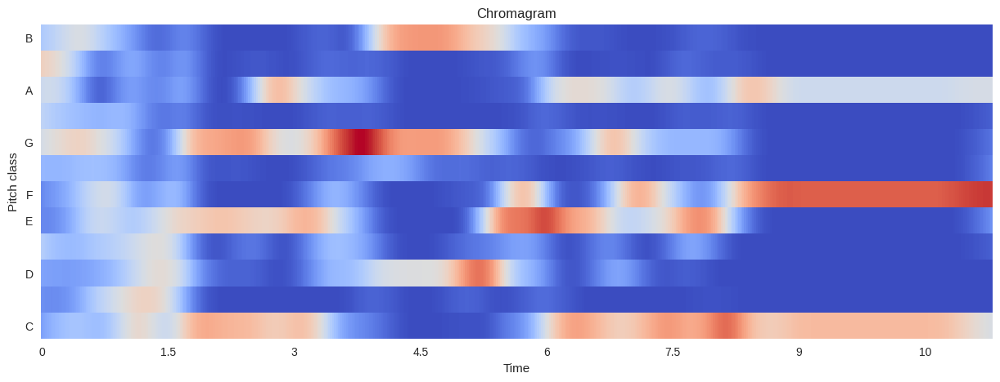

In [ ]:
# lets chunk the chromagram
y_4chords, sr = librosa.load(file_test, sr=sr)
chromagram = librosa.feature.chroma_cens(y=y_4chords, sr=sr)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=512, cmap='coolwarm')
# plt.colorbar(format='%+2.0f dB')
plt.title('Chromagram')

In [ ]:
### Chroma features and harmonic analysis

"""
Chroma features represent the distribution of energy of the signal across the 12 different pitch classes
Particulalry useful for harmonic analysis and key detection.
"""

def analyze_chroma_features(y, sr, title='Chroma Features'):

  # compute chroma features
  chroma = librosa.feature.chroma_stft(y=y, sr=sr)
  chroma_cens = librosa.feature.chroma_cens(y=y, sr=sr)
  chroma_cqt = librosa.feature.chroma_cqt(y=y, sr=sr)

  # timeframes
  frames = range(len(chroma))
  t = librosa.frames_to_time(frames, sr=sr)

  # plot
  plt.figure(figsize=(15, 12))
  # Standard chroma
  plt.subplot(3, 2, 1)
  librosa.display.specshow(chroma, sr=sr, x_axis='time', y_axis='chroma',  cmap='Blues')
  plt.colorbar()
  plt.title(f'{title} - Chromagram')
  plt.xlabel('Time (seconds)')
  plt.ylabel('Chroma bins')

  # Chroma CENS
  plt.subplot(3, 2, 2)
  librosa.display.specshow(chroma_cens, sr=sr, x_axis='time', y_axis='chroma',  cmap='Blues')
  plt.colorbar()
  plt.title(f'{title} - Chromagram CENS')
  plt.xlabel('Time (seconds)')
  plt.ylabel('Chroma bins')

  # CQT Chroma
  plt.subplot(3, 2, 3)
  librosa.display.specshow(chroma_cqt, sr=sr, x_axis='time', y_axis='chroma',  cmap='Blues')
  plt.colorbar()
  plt.title(f'{title} - Chromagram CQT')
  plt.xlabel('Time (seconds)')
  plt.ylabel('Chroma bins')

  # Avg chroma distribution
  plt.subplot(3, 2, 4)
  chroma_mean = np.mean(chroma, axis=1)
  # plt.plot(t, chroma_mean, alpha=0.8, linewidth=2)
  pitch_classes = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']
  plt.bar(pitch_classes, chroma_mean, alpha=0.7)
  plt.title(f'{title} - Average Chroma Distribution')
  plt.xlabel('Pitch Class')
  plt.ylabel('Chroma Mean')
  plt.grid(True, alpha=0.3)

  # Chroma over time for dominant pitch classes
  plt.subplot(3, 2, 5)
  frames = range(chroma.shape[1])
  t = librosa.frames_to_time(frames, sr=sr)

  # find the most dominant pitch class
  dominant_pitch_class = np.argmax(chroma, axis=0)
  dominant_classes = np.argsort(chroma_mean)[-4:] # top 4 classes
  for i in dominant_classes:
    plt.plot(t, chroma[i], alpha=0.8, linewidth=2, label=f'{pitch_classes[i]}')

  plt.title(f'{title} - Chroma over time for dominant pitch classes')
  plt.xlabel('Time (seconds)')
  plt.ylabel('Chroma')
  plt.legend()
  plt.grid(True, alpha=0.3)

  # Chroma correlation matrix
  plt.subplot(3, 2, 6)
  chroma_corr = np.corrcoef(chroma)
  plt.imshow(chroma_corr, cmap='RdBu_r', aspect='auto')
  plt.colorbar()
  plt.title(f'{title} - Chroma Correlation Matrix')
  plt.xlabel('Chroma bins')
  plt.ylabel('Chroma bins')

  plt.tight_layout()
  plt.show()

  return chroma, chroma_cens, chroma_cqt



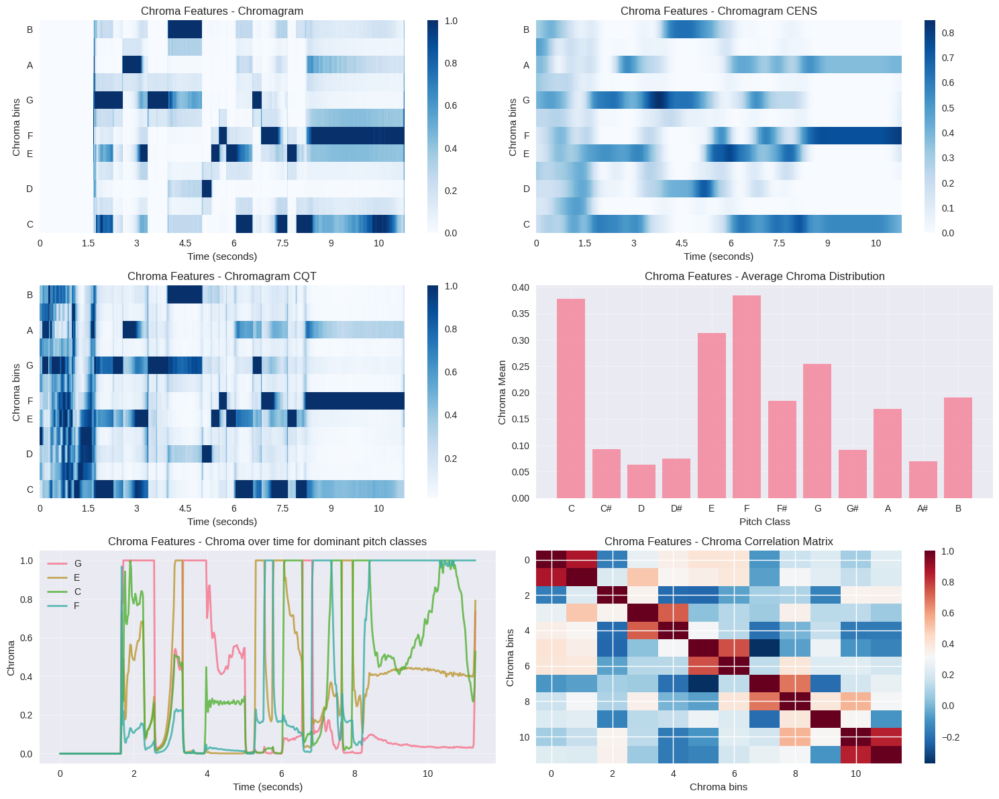

In [ ]:
chroma_4chords, chroma_cens_4chords, chroma_cqt_4chords = analyze_chroma_features(y_4chords, sr)

### Tempo and Beat Analysis
Tempo estimation and beat tracking for rhythmic analysis

In [51]:
def analyze_tempo_and_beats(y, sr, title='Tempo and Beats'):

  # tempo
  hop_length = 512
  # onset envelop
  onset_env = librosa.onset.onset_strength(y=y, sr=sr, hop_length=hop_length)
  # tempo and beats
  tempo, beats = librosa.beat.beat_track(y=y, sr=sr)
  # tempogram
  tempogram = librosa.feature.tempogram(onset_envelope=onset_env, sr=sr, hop_length=hop_length)

  plt.figure(figsize=(15, 12))
  # tempogram - waveform with detected beats
  plt.subplot(3, 2, 1)
  # librosa.display.specshow(tempogram, x_axis='time', y_axis='tempo', cmap='coolwarm')
  times = np.arange(len(y)) / sr # correct time axis
  plt.plot(times, y, alpha=0.6, label='Waveform')
  beat_times = librosa.frames_to_time(beats, sr=sr)
  plt.vlines(beat_times, y.min(), y.max(), color='r', alpha=0.8, linestyle='--', label='Beats')
  plt.title(f'{title} - Waveform with detected beats')
  plt.xlabel('Time (seconds)')
  plt.ylabel('Amplitude')
  plt.legend()
  plt.grid(True, alpha=0.3)

  # onset strength function
  plt.subplot(3, 2, 2)
  times = librosa.frames_to_time(np.arange(len(onset_env)), sr=sr, hop_length=hop_length)
  plt.plot(times, onset_env, alpha=0.8, linewidth=2, label='onset strength')
  plt.vlines(beat_times, 0, onset_env.max(), color='r', alpha=0.8, linestyle='--', label='Beats')
  plt.title(f'{title} - Onset strength function')
  plt.xlabel('Time (seconds)')
  plt.ylabel('Onset strength')
  plt.legend()
  plt.grid(True, alpha=0.3)

  # tempo (time v tempo)
  plt.subplot(3, 2, 3)
  # plt.plot(tempogram, cmap='coolwarm')
  librosa.display.specshow(tempogram, x_axis='time', y_axis='tempo', cmap='coolwarm', hop_length=hop_length)
  plt.title(f'{title} - Tempogram')
  plt.xlabel('Time (frames)')
  plt.ylabel('Tempo (BPM)')

  # Beat interval histogram
  plt.subplot(3, 2, 4)
  if len(beats) > 1:
    beat_intervals = np.diff(librosa.frames_to_time(beats, sr=sr))
    plt.hist(beat_intervals, bins=20, alpha=0.7, edgecolor='black')
    plt.title(f'{title} - Beat interval histogram')
    plt.xlabel('Beat interval (seconds)')
    plt.ylabel('Frequency')
    plt.grid(True, alpha=0.3)

  # Tempo stability over time
  plt.subplot(3, 2, 5)
  window_size = sr * 4 # 4-sec window
  local_tempo = []

  for start in range(0, len(y) - window_size, window_size // 2):
    end = start + window_size
    y_window = y[start:end]
    if len(y_window) > sr:
      tempo_local, _ = librosa.beat.beat_track(y=y_window, sr=sr)
      local_tempo.append(tempo_local)

  if local_tempo:
    time_windows = np.arange(len(local_tempo)) * (window_size // 2) / sr
    plt.plot(time_windows, local_tempo, alpha=0.8, linewidth=2, marker='o')
    plt.axhline(y=float(tempo), color='red', alpha=0.8, linestyle='--', label='Global tempo: {float(tempo):.1f} BPM')
    plt.title(f'{title} - Tempo stability over time')
    plt.xlabel('Time (seconds)')
    plt.ylabel('Tempo (BPM)')
    plt.grid(True, alpha=0.3)
    plt.legend()

  # Beat strength over time
  plt.subplot(3, 2, 6)
  if len(beats) > 1:
    beat_strengths = onset_env[beats]
    plt.plot(beat_times, beat_strengths, alpha=0.8, linewidth=2, marker='o')
    plt.title(f'{title} - Beat strength over time')
    plt.xlabel('Time (seconds)')
    plt.ylabel('Beat strength')
    plt.grid(True, alpha=0.3)


  plt.tight_layout()
  plt.show()

  # print summary
  print(f"{title} - Tempo analysis")
  print(f"Tempo: {float(tempo):.1f} BPM")
  print(f"Number of beats: {len(beats)}")
  if len(beats) > 1:
    print(f"Average beat interval: {np.mean(np.diff(librosa.frames_to_time(beats, sr=sr))):.2f} seconds")

  return tempo, beats, tempogram, onset_env



/tmp/ipython-input-852370902.py:70: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.axhline(y=float(tempo), color='red', alpha=0.8, linestyle='--', label='Global tempo: {float(tempo):.1f} BPM')


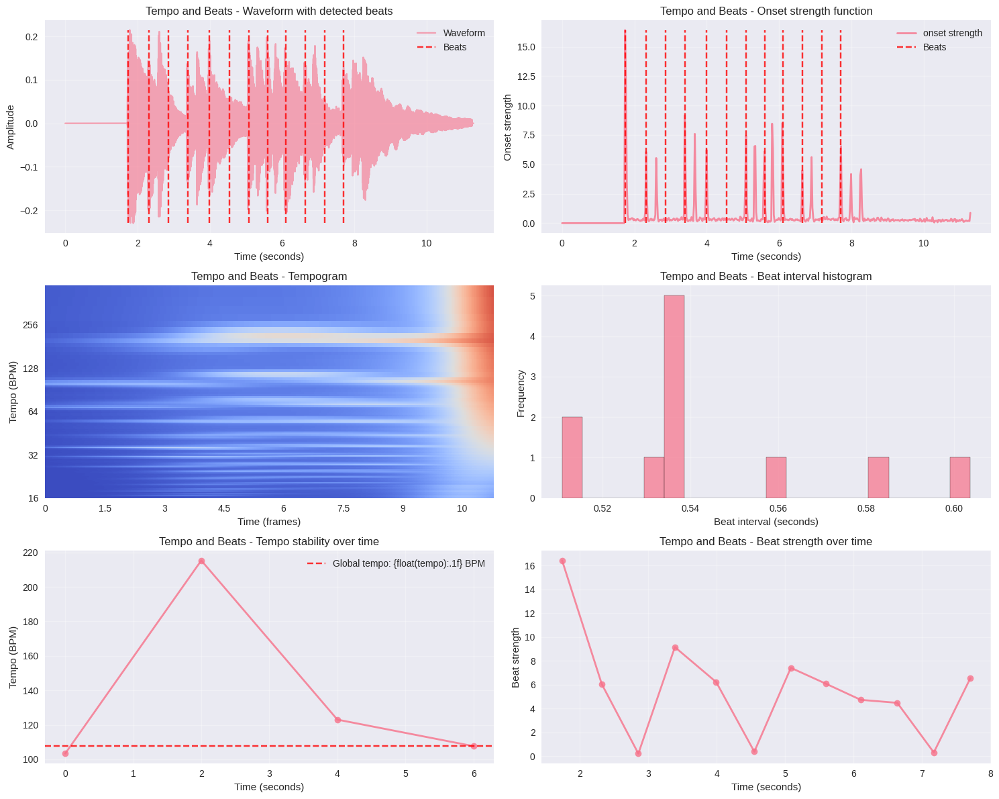

Tempo and Beats - Tempo analysis
Tempo: 107.7 BPM
Number of beats: 12
Average beat interval: 0.54 seconds


/tmp/ipython-input-852370902.py:93: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Tempo: {float(tempo):.1f} BPM")


In [52]:
tempo_4chords, beats_4chords, tempogram_4chords, onset_env_4chords = analyze_tempo_and_beats(y_4chords, sr)


In [53]:
y, sr, duration = load_and_analyze_audio(file_path=librosa.ex('vibeace'))

Audio file: Choice (example)
Sample rate: sr=22050
Duration: duration=25.03
Number of samples: num_samples=551823
Audio shape: y.shape=(551823,)
Data type: y.dtype=dtype('float32')
Value range: -0.329 to 0.381


/tmp/ipython-input-852370902.py:70: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.axhline(y=float(tempo), color='red', alpha=0.8, linestyle='--', label='Global tempo: {float(tempo):.1f} BPM')


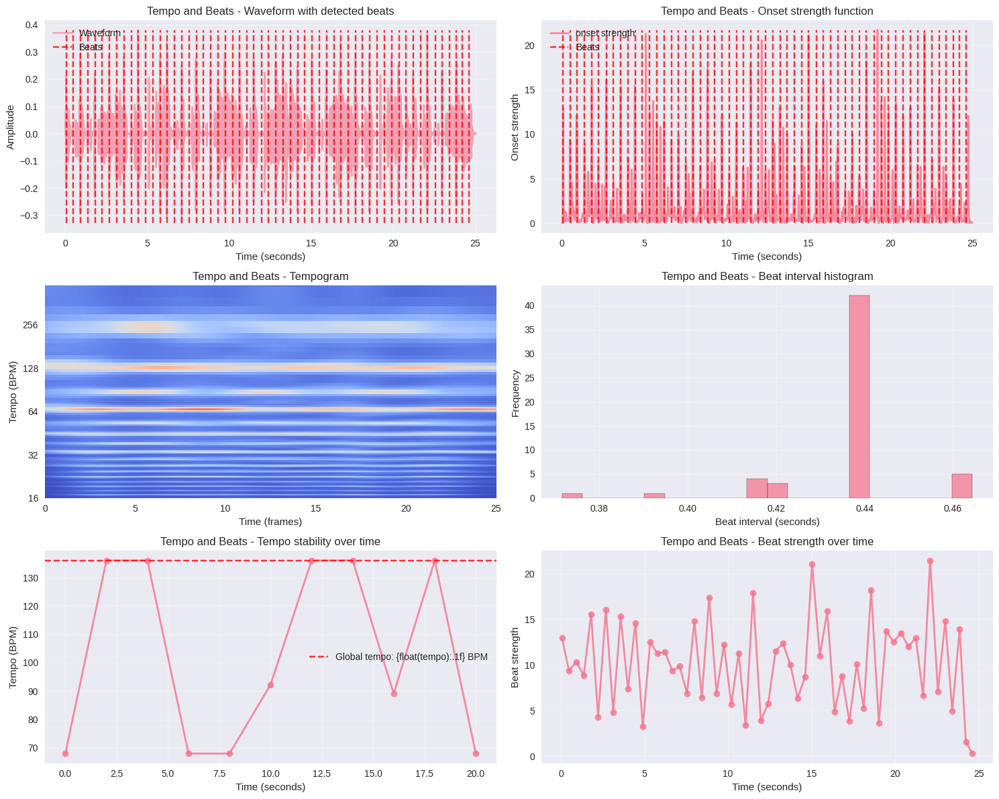

Tempo and Beats - Tempo analysis
Tempo: 136.0 BPM
Number of beats: 57
Average beat interval: 0.44 seconds


/tmp/ipython-input-852370902.py:93: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Tempo: {float(tempo):.1f} BPM")


In [54]:
# now run its tempo analysis
tempo_vibeace, beats_vibeace, tempogram_vibeace, onset_env_vibeace = analyze_tempo_and_beats(y, sr)


In [55]:
# Get the file Paranoid
paranoid_song_url = 'https://www.youtube.com/watch?v=BOTIIw76qiE'
file_paranoid_song = download_youtube_audio_as_mp3(paranoid_song_url)
print(f"Downloaded song to: {file_paranoid_song}")

Downloaded and converted to: Rick Astley - Never Gonna Give You Up (Official Video) (4K Remaster).mp3
Downloaded song to: Rick Astley - Never Gonna Give You Up (Official Video) (4K Remaster).mp3


In [56]:
!ls -l

total 6436
-rw-r--r-- 1 root root  112461 Aug 20 18:47  4chords.mp3
-rw-r--r-- 1 root root 2723325 Aug 20 20:38 'Black Sabbath - Paranoid (Official Audio).mp3'
drwx------ 5 root root    4096 Aug 20 18:28  drive
-rw-r--r-- 1 root root 3743085 Aug 20 18:43 'Rick Astley - Never Gonna Give You Up (Official Video) (4K Remaster).mp3'
drwxr-xr-x 1 root root    4096 Aug 19 13:38  sample_data


In [57]:
!mv 'Black Sabbath - Paranoid (Official Audio).mp3' paranoid.mp3
!cp paranoid.mp3 /content/drive/MyDrive/

In [61]:
paranoid_file = 'paranoid.mp3'
y, sr, duration = load_and_analyze_audio(file_path=paranoid_file, use_example=False)

Audio file: paranoid.mp3
Sample rate: sr=22050
Duration: duration=168.43
Number of samples: num_samples=3713793
Audio shape: y.shape=(3713793,)
Data type: y.dtype=dtype('float32')
Value range: -0.893 to 0.850


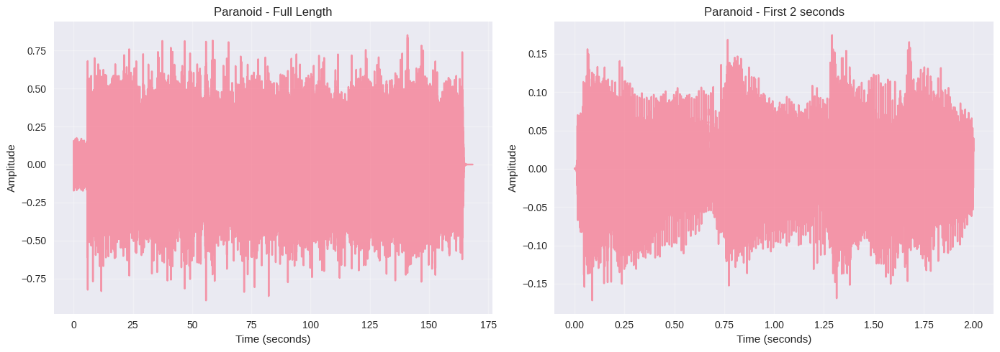

In [63]:
# plot Paranoid
plot_waveform(y, sr, title='Paranoid')

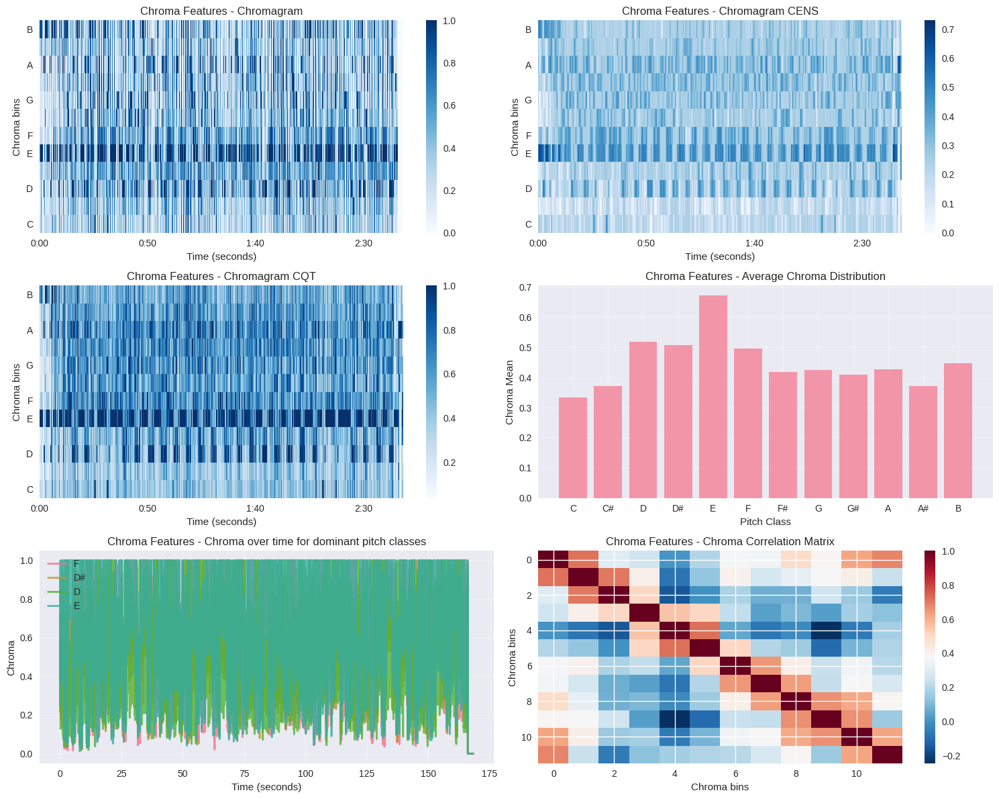

In [64]:
# plot chroma of Paranoid
chroma_paranoid, chroma_cens_paranoid, chroma_cqt_paranoid = analyze_chroma_features(y, sr)

/tmp/ipython-input-852370902.py:70: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.axhline(y=float(tempo), color='red', alpha=0.8, linestyle='--', label='Global tempo: {float(tempo):.1f} BPM')
/tmp/ipython-input-852370902.py:88: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


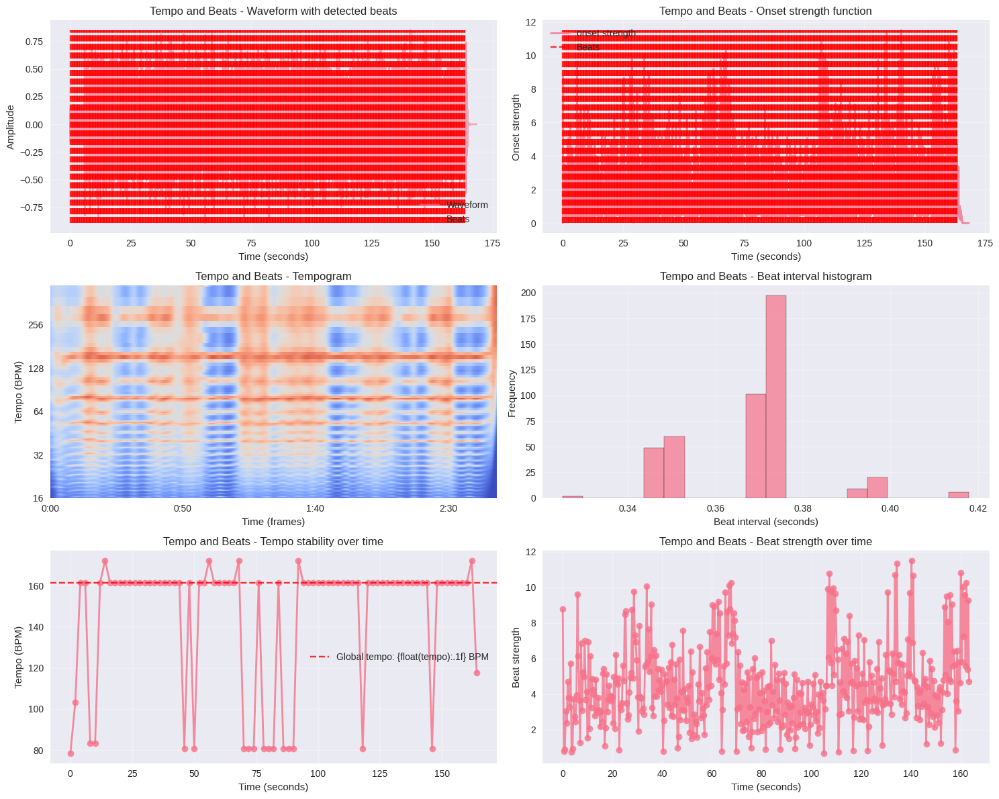

Tempo and Beats - Tempo analysis
Tempo: 161.5 BPM
Number of beats: 445
Average beat interval: 0.37 seconds


/tmp/ipython-input-852370902.py:93: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Tempo: {float(tempo):.1f} BPM")


In [65]:
# plot beats for Paranoid
tempo_paranoid, beats_paranoid, tempogram_paranoid, onset_env_paranoid = analyze_tempo_and_beats(y, sr)